In [ ]:
[# Import TensorFlow into Colab
import tensorflow as tf
import tensorflow_hub as hub
print("TensorFlow Version : ", tf.__version__)
print("TensorFlow Hub Version : ", hub.__version__)

TensorFlow Version :  2.13.0
TensorFlow Hub Version :  0.14.0


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import warnings
warnings.simplefilter("ignore", category=PendingDeprecationWarning) # Handle Deprecation Warnings

In [ ]:
import pandas as pd
labels = pd.DataFrame(columns = ["filenames","labels"])
labels

,filenames,labels


In [ ]:
# Labels Dictionary
labels_dict = { 0: "glioma_tumor",
                1: "meningioma_tumor",
                2: "no_tumor",
                3: "pituitary_tumor" }

In [ ]:
import os

for i in os.listdir("/content/drive/MyDrive/BrainTumor/Training/glioma_tumor"):
    labels.loc[len(labels.index)] = [i, "glioma_tumor"]
for i in os.listdir("/content/drive/MyDrive/BrainTumor/Training/meningioma_tumor"):
    labels.loc[len(labels.index)] = [i, "meningioma_tumor"]
for i in os.listdir("/content/drive/MyDrive/BrainTumor/Training/no_tumor"):
    labels.loc[len(labels.index)] = [i, "no_tumor"]
for i in os.listdir("/content/drive/MyDrive/BrainTumor/Training/pituitary_tumor"):
    labels.loc[len(labels.index)] = [i, "pituitary_tumor"]

labels.to_csv("/content/drive/MyDrive/BrainTumor/labels.csv")

In [ ]:
# Create pathnames from image IDs
filenames = []
for i in range(0, len(labels)):
    filenames.append("drive/MyDrive/BrainTumor/Training/"+ labels["labels"][i] + "/" + labels["filenames"][i])

# Check the first 10
filenames[:10]

['drive/MyDrive/BrainTumor/Training/glioma_tumor/gg (111).jpg',
 'drive/MyDrive/BrainTumor/Training/glioma_tumor/gg (105).jpg',
 'drive/MyDrive/BrainTumor/Training/glioma_tumor/gg (102).jpg',
 'drive/MyDrive/BrainTumor/Training/glioma_tumor/gg (1).jpg',
 'drive/MyDrive/BrainTumor/Training/glioma_tumor/gg (101).jpg',
 'drive/MyDrive/BrainTumor/Training/glioma_tumor/gg (100).jpg',
 'drive/MyDrive/BrainTumor/Training/glioma_tumor/gg (10).jpg',
 'drive/MyDrive/BrainTumor/Training/glioma_tumor/gg (135).jpg',
 'drive/MyDrive/BrainTumor/Training/glioma_tumor/gg (131).jpg',
 'drive/MyDrive/BrainTumor/Training/glioma_tumor/gg (130).jpg']

In [ ]:
labels.head()

,filenames,labels
0,gg (111).jpg,glioma_tumor
1,gg (105).jpg,glioma_tumor
2,gg (102).jpg,glioma_tumor
3,gg (1).jpg,glioma_tumor
4,gg (101).jpg,glioma_tumor


In [ ]:
labels = labels["labels"]
labels

0          glioma_tumor
1          glioma_tumor
2          glioma_tumor
3          glioma_tumor
4          glioma_tumor
             ...       
2853    pituitary_tumor
2854    pituitary_tumor
2855    pituitary_tumor
2856    pituitary_tumor
2857    pituitary_tumor
Name: labels, Length: 2858, dtype: object

## Import CSV & Make Labels

In [ ]:
import numpy as np
# import pandas as pd
# # Check if all labels are unique
# labels = pd.read_csv('/content/drive/MyDrive/BrainTumor/labels.csv')
unique_labels = np.unique(labels)
len(unique_labels)

4

In [ ]:
labels

0          glioma_tumor
1          glioma_tumor
2          glioma_tumor
3          glioma_tumor
4          glioma_tumor
             ...       
2853    pituitary_tumor
2854    pituitary_tumor
2855    pituitary_tumor
2856    pituitary_tumor
2857    pituitary_tumor
Name: labels, Length: 2858, dtype: object

In [ ]:
# Turn every label into a boolean array (Compare with all classes and the only True value will be the class it belongs to)
print(labels[0])
labels[0] == unique_labels

glioma_tumor


array([ True, False, False, False])

In [ ]:
# Do this for all labels

boolean_labels = [label == unique_labels for label in labels]
boolean_labels[:2]

[array([ True, False, False, False]), array([ True, False, False, False])]

In [ ]:
len(boolean_labels)

2858

In [ ]:
# Setup X and y variables

X = filenames
y = boolean_labels

In [ ]:
len(filenames)

2858

In [ ]:
# Let's split our data using Scikit-Learn's train-test-split
from sklearn.model_selection import train_test_split

# Split into training & validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y,test_size = 0.2, random_state = 42)
len(X_train), len(y_train), len(X_val), len(y_val)

(2286, 2286, 572, 572)

In [ ]:
# Let's have a gaze at the training data (filenames & boolean_labels)
X_train[0], y_train[0]

('drive/MyDrive/BrainTumor/Training/pituitary_tumor/p (570).jpg',
 array([False, False, False,  True]))

In [ ]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape # Height, Width, Colour Channel (RGB)

(512, 512, 3)

In [ ]:
image.max(), image.min() # All values are pixel brightness values between 0 and 255

(253, 0)

In [ ]:
image[:2]

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]]], dtype=uint8)

In [ ]:
tf.constant(image[:2]) # Turned the image into a tensor, can be run on a GPU for faster processing

<tf.Tensor: shape=(2, 512, 3), dtype=uint8, numpy=
array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [1, 1, 1],
        [1, 1, 1],
        [1, 1, 1]]], dtype=uint8)>

## Processing Function

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path):
  """
  Takes an image file path and turns the image into a Tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)

  # Turn the jpg image into a numerical tensor with three color channels (RGB)
  image = tf.image.decode_jpeg(image, channels = 3)

  # Convert the colour channel values from 0-255 values to 0-1 values (Image Representation Using Floating Points Needs 0-1 Values)
  image = tf.image.convert_image_dtype(image, tf.float32) # Normalization !

  # Resize our image to our desired size (224,224)
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])

  return image

## Processing Function

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path and the associated label
  Processes image and returns tuple of (image, label)
  """
  image = process_image(image_path)
  return image, label

In [ ]:
get_image_label(X[0],tf.constant(y[0]))
# Demo Of The Above

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         ...,
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ]],
 
        [[0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         ...,
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ]],
 
        [[0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         ...,
         [0.00392157, 0.00392157, 0.00392157],
         [0.00392157, 0.00392157, 0.00392157],
         [0.00392157, 0.00392157, 0.00392157]],
 
        ...,
 
        [[0.00392157, 0.00392157

## Processing Function

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn our data into batches
def create_data_batches(X, y = None, batch_size = BATCH_SIZE, val_data = False, test_data = False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (No Labels)
  """
  # If the data is a test dataset, we don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only filepaths, no labels (Makes dataset from slices of given tensor)
    data_batch = data.map(process_image).batch(BATCH_SIZE) # Creates batches of given batch size
    return data_batch

  # If the data is validation dataset, we don't need to shuffle it
  elif val_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),  # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else: # It's training data
    print("Creating training data batches...")
    # Turn filepaths and labels into tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                               tf.constant(y)))
    # Shuffling before preprocessing images is faster
    data = data.shuffle(buffer_size = len(X))

    # Create (image, label) tuples and preprocess the image
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

In [ ]:
# Creating training and validation data batches

train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, val_data = True)

Creating training data batches...
Creating validation data batches...


In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a given data batch.
  """
  # Setup the figure
  plt.figure(figsize = (10,10))
  # Loop through 25 (for dislaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_labels[labels[i].argmax()])
    # Turn grid lines off
    plt.axis("off")

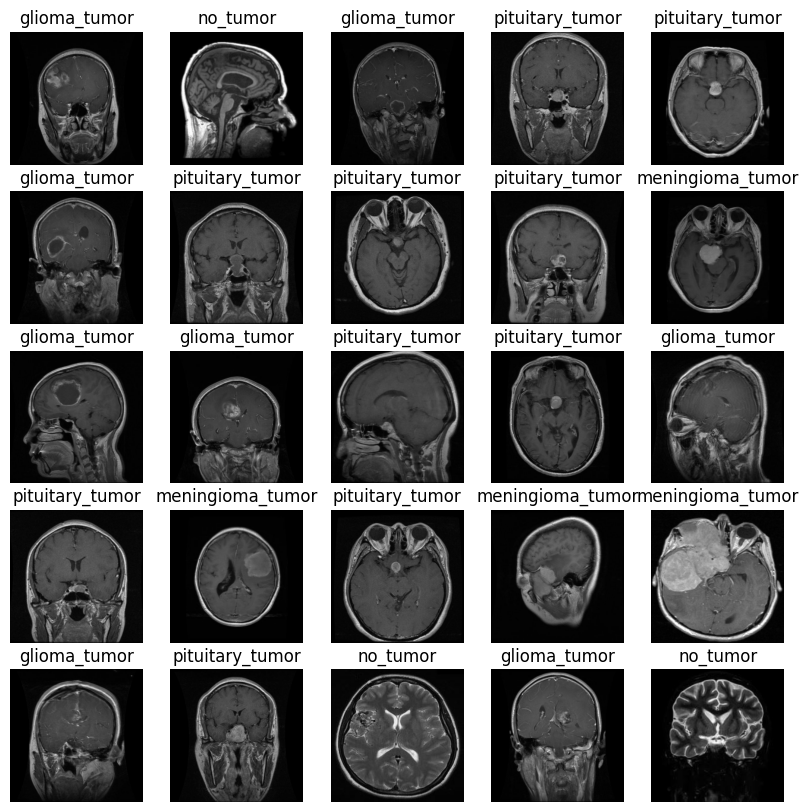

In [ ]:
# Now let's visualize the data in our training batch!
train_images, train_labels = next(train_data.as_numpy_iterator()) # Takes a batch from our batched dataset and turns it into iterable numpy array
show_25_images(train_images, train_labels)

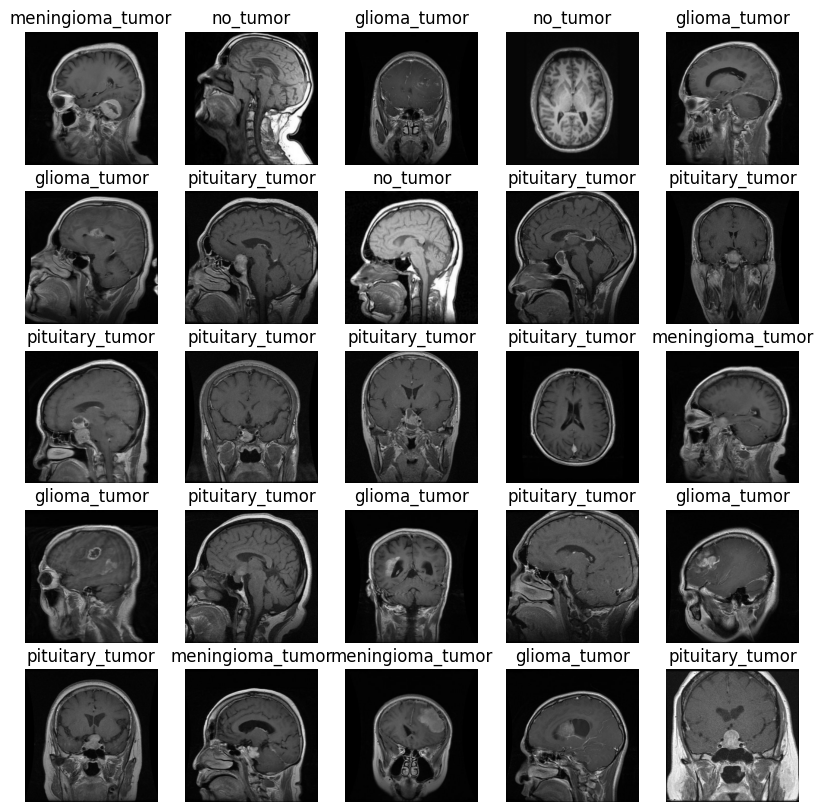

In [ ]:
# Now, let's visualize our validation set!

val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

In [ ]:
# Setup input shape
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # (batch size, height, width, color channels)

# Setup output shape
OUTPUT_SHAPE = len(unique_labels)

# Setup model URL
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5"

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), # A friend telling our model how to improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting

  return model

In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5
Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer_2 (KerasLayer)  (None, 1001)              5508713   
                                                                 
 dense_2 (Dense)             (None, 4)                 4008      
                                                                 
Total params: 5512721 (21.03 MB)
Trainable params: 4008 (15.66 KB)
Non-trainable params: 5508713 (21.01 MB)
_________________________________________________________________


In [ ]:
# Save the model.
import joblib
joblib.dump(model, "mri.joblib")

['mri.joblib']

In [ ]:
# Load TensorBoard Notebook Extension

%load_ext tensorboard
# Magic Function To Load Notebook Extension"

In [ ]:
import datetime
from keras.callbacks import TensorBoard, EarlyStopping
# Create a function to build a TensorBoard Callback

def create_tensorboard_callback():

  # Create a log directory to store TensorBoard logs which get tracked whenever we run an experiment
  logdir = os.path.join("drive/MyDrive/BrainTumor/logs",
                        datetime.datetime.now().strftime("%Y%m%d-%H%m%s"))
  return TensorBoard(logdir)

In [ ]:
# Create Early Stopping Callback ( Monitor - Value To Be Tracked For Stopping , Patience = No. Of Epochs To Tolerate)

early_stopping = EarlyStopping(monitor = "val_accuracy",
                               patience = 3)

In [ ]:
# Build a function to train and return a model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session whenever we train our model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x = train_data,
            epochs = 100,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])

  # Return the fitted model
  return model

In [ ]:
#  Fit the model to our data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5
Epoch 1/100
72/72 [==============================] - 370s 5s/step - loss: 0.7810 - accuracy: 0.6969 - val_loss: 0.4991 - val_accuracy: 0.8042
Epoch 2/100
72/72 [==============================] - 9s 127ms/step - loss: 0.4114 - accuracy: 0.8473 - val_loss: 0.4134 - val_accuracy: 0.8392
Epoch 3/100
72/72 [==============================] - 8s 117ms/step - loss: 0.3400 - accuracy: 0.8701 - val_loss: 0.4099 - val_accuracy: 0.8462
Epoch 4/100
72/72 [==============================] - 7s 101ms/step - loss: 0.3001 - accuracy: 0.8867 - val_loss: 0.3733 - val_accuracy: 0.8654
Epoch 5/100
72/72 [==============================] - 7s 101ms/step - loss: 0.2756 - accuracy: 0.8976 - val_loss: 0.3638 - val_accuracy: 0.8759
Epoch 6/100
72/72 [==============================] - 10s 135ms/step - loss: 0.2569 - accuracy: 0.9024 - val_loss: 0.3643 - val_accuracy: 0.8689
Epoch 7/100
72/72 [========================

In [ ]:
%tensorboard --logdir drive/My\ Drive/BrainTumor/logs

<IPython.core.display.Javascript object>

In [ ]:
# Make predictions on the validation data (not used to train on)

predictions = model.predict(val_data, verbose = 1) # verbose -> print description of process
predictions

18/18 [==============================] - 28s 120ms/step


array([[4.4133845e-01, 5.5793649e-01, 1.2080643e-04, 6.0420332e-04],
       [4.2889686e-03, 6.3923262e-02, 9.2100537e-01, 1.0782425e-02],
       [9.9342030e-01, 6.5413937e-03, 8.5316707e-08, 3.8115388e-05],
       ...,
       [8.6046553e-01, 1.3764137e-01, 5.7531876e-04, 1.3178430e-03],
       [1.3775718e-04, 6.2312376e-02, 9.3712008e-01, 4.2972682e-04],
       [7.5403929e-02, 9.2118931e-01, 2.4875135e-05, 3.3819359e-03]],
      dtype=float32)

In [ ]:
predictions.shape # Probabilities of all 4 classes for all images in validation data

(572, 4)

In [ ]:
# Checking Out A Prediction

index = 42
print(predictions[index])
print(f"Maximum Value (Probability Of Prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Maximum Index: {np.argmax(predictions[index])}")
print(f"Predicted Label: {unique_labels[np.argmax(predictions[index])]}")

[0.32485545 0.6499649  0.01124136 0.01393832]
Maximum Value (Probability Of Prediction): 0.6499649286270142
Sum: 1.0000001192092896
Maximum Index: 1
Predicted Label: meningioma_tumor


## Prediction Function

In [ ]:
# Turn prediction probabilities into their respective label (Easy To Understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a prediction label
  """
  return unique_labels[np.argmax(prediction_probabilities)]

# # Get a predicted label based on an array of prediction probabilities
# pred_label = get_pred_label(predictions[42])
# pred_label

In [ ]:
# Create a function to unbatch a batched dataset

def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and return separate arrays of images and labels
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(get_pred_label(label))

  return images, labels

In [ ]:
# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0], val_labels[0]

(array([[[0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         ...,
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ]],
 
        [[0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         ...,
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ]],
 
        [[0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.        ],
         ...,
         [0.00392157, 0.00392157, 0.00392157],
         [0.00392157, 0.00392157, 0.00392157],
         [0.00392157, 0.00392157, 0.00392157]],
 
        ...,
 
        [[0.        , 0.        , 0.        ],
         [0.        , 0.        , 0.     

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n = 1):
  """
  View the prediction, ground truth and image for sample 'n'
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get The Predicted Label
  pred_label = get_pred_label(pred_prob)

  # Plot Image & Remove Ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change The Colour Of The Title Depending On Right / Wrong Prediction
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change Plot Title
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color = color)

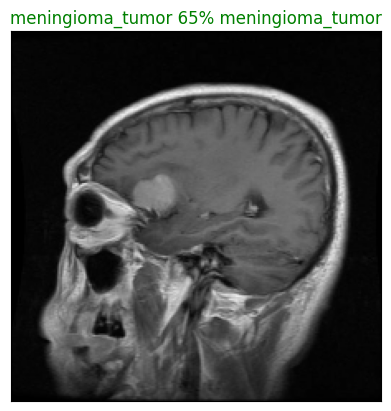

In [ ]:
plot_pred(prediction_probabilities = predictions, labels = val_labels, images = val_images, n = 42)

In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n = 1):
  """
  Plot the top highest prediction confidences along with the truth label for sample n:
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob) # [0.2, 0.6, 0.1, 0.1]

  # Find the top prediction probability/confidence indexes
  top_pred_indexes = pred_prob.argsort()[::-1]

  # Find the top prediction probability/confidence values
  top_pred_values = pred_prob[top_pred_indexes]

  # Find the top prediction labels
  top_pred_labels = unique_labels[top_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_pred_labels)),
                     top_pred_values,
                     color="grey")

  # Number of bars on x-axis = No. of labels
  plt.xticks(np.arange(len(top_pred_labels)),
             labels = top_pred_labels,
             rotation = "vertical")

  # Change color of true label
  if np.isin(true_label, top_pred_labels): # If first argument is present in second argument
    top_plot[np.argmax(top_pred_labels == true_label)].set_color("green") # Set color of true label bar to green
  else:
    pass

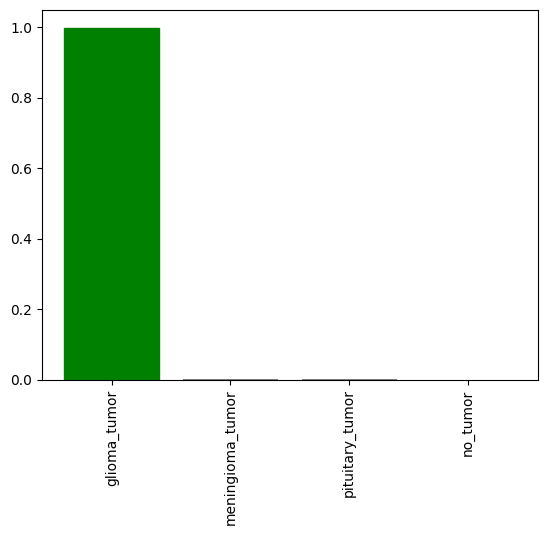

In [ ]:
plot_pred_conf(prediction_probabilities = predictions,
               labels = val_labels,
               n = 60)

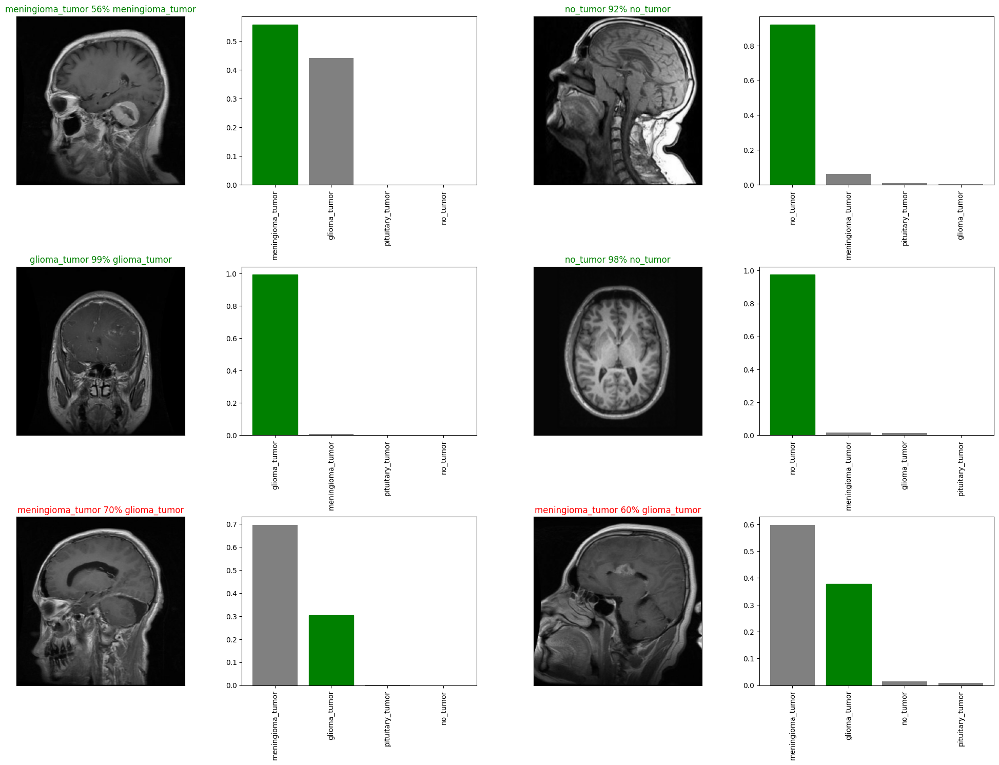

In [ ]:
# Let's check out a few predictions and their different values

i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols
plt.figure(figsize = (10 * num_cols, 5 * num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2 * num_cols, 2*i + 1)
  plot_pred(prediction_probabilities = predictions,
            labels = val_labels,
            images = val_images,
            n = i + i_multiplier)
  plt.subplot(num_rows, 2 * num_cols, 2*i + 2)
  plot_pred_conf(prediction_probabilities = predictions,
                 labels = val_labels,
                 n = i + i_multiplier)
plt.tight_layout(h_pad = 1.0)
plt.show()

In [ ]:
# Create a function to save a model

def save_model(model, suffix = None):
  """
  Saves a given model in our models directory and appends a suffix (string)
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/MyDrive/BrainTumor/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%m%s"))
  model_path = modeldir + "-" + suffix + ".h5" # Save format of model
  print(f"Saving Model To : {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
# Create a function to load a trained model

def load_model(model_path):
  """
  Loads a saved model from a specified path
  """
  print(f"Loading Saved Model From: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer": hub.KerasLayer})
  return model

In [ ]:
# Save our model trained on 1000 images

save_model(model, suffix = "train-val-mobilenetv3-Adam")

Saving Model To : drive/MyDrive/BrainTumor/models/20230912-15091694532379-train-val-mobilenetv3-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/BrainTumor/models/20230912-15091694532379-train-val-mobilenetv3-Adam.h5'

In [ ]:
# Load our model trained on 1000 images

loaded_model = load_model("drive/MyDrive/BrainTumor/models/20230414-11041681473566-train-val-mobilenetv3-Adam.h5")

Loading Saved Model From: drive/MyDrive/BrainTumor/models/20230414-11041681473566-train-val-mobilenetv3-Adam.h5


In [ ]:
# Evaluate the pre-saved model

model.evaluate(val_data)

18/18 [==============================] - 2s 103ms/step - loss: 0.3190 - accuracy: 0.8741


[0.31902021169662476, 0.8741258978843689]

In [ ]:
# Evaluate the loaded model

loaded_model.evaluate(val_data)

18/18 [==============================] - 3s 114ms/step - loss: 0.2274 - accuracy: 0.9108


[0.2274191528558731, 0.9108391404151917]

In [ ]:
len(X), len(y)

(2858, 2858)

In [ ]:
# Create a data batch with the full dataset
full_data = create_data_batches(X, y)

Creating training data batches...


In [ ]:
# Create a model for full data

full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v3_large_100_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all data, we can't monitor validation accuracy
full_model_early_stopping = EarlyStopping(monitor = "accuracy",
                                          patience = 3)

In [ ]:
# Fit the full model to the full data

full_model.fit(x = full_data,
               epochs = 100,
               callbacks = [full_model_tensorboard, full_model_early_stopping])

90/90 [==============================] - 14s 102ms/step - loss: 0.8095 - accuracy: 0.6819
Epoch 2/100
90/90 [==============================] - 10s 114ms/step - loss: 0.4079 - accuracy: 0.8499
Epoch 3/100
90/90 [==============================] - 10s 113ms/step - loss: 0.3635 - accuracy: 0.8670
Epoch 4/100
90/90 [==============================] - 9s 98ms/step - loss: 0.3106 - accuracy: 0.8786
Epoch 5/100
90/90 [==============================] - 7s 82ms/step - loss: 0.2717 - accuracy: 0.8978
Epoch 6/100
90/90 [==============================] - 9s 96ms/step - loss: 0.2540 - accuracy: 0.9055
Epoch 7/100
90/90 [==============================] - 9s 98ms/step - loss: 0.2410 - accuracy: 0.9101
Epoch 8/100
90/90 [==============================] - 8s 83ms/step - loss: 0.2280 - accuracy: 0.9178
Epoch 9/100
90/90 [==============================] - 8s 93ms/step - loss: 0.2189 - accuracy: 0.9195
Epoch 10/100
90/90 [==============================] - 9s 97ms/step - loss: 0.2084 - accuracy: 0.9223
Epoch

In [ ]:
save_model(full_model, suffix = "full-image-set-mobilenetv3-Adam")

Saving Model To : drive/MyDrive/BrainTumor/models/20230912-15091694532682-full-image-set-mobilenetv3-Adam.h5...


'drive/MyDrive/BrainTumor/models/20230912-15091694532682-full-image-set-mobilenetv3-Adam.h5'

## Load The Saved Model (Change The Path To Where You Saved The Model)

In [ ]:
# Load in the saved model

loaded_full_model = load_model("drive/MyDrive/BrainTumor/models/20230414-12041681473994-full-image-set-mobilenetv3-Adam.h5")

Loading Saved Model From: drive/MyDrive/BrainTumor/models/20230414-12041681473994-full-image-set-mobilenetv3-Adam.h5


## Load The Images For Which You Need Prediction

In [ ]:
import os
# Get custom image filepaths
custom_path = "drive/MyDrive/BrainTumor/Testing/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [ ]:
custom_image_paths

['drive/MyDrive/BrainTumor/Testing/Meningioma3.jpg',
 'drive/MyDrive/BrainTumor/Testing/NoTumor.jpg',
 'drive/MyDrive/BrainTumor/Testing/Meningioma1.jpg',
 'drive/MyDrive/BrainTumor/Testing/Tumor.png',
 'drive/MyDrive/BrainTumor/Testing/Sign.jpg',
 'drive/MyDrive/BrainTumor/Testing/Glioma.jpg',
 'drive/MyDrive/BrainTumor/Testing/meningioma_parasagittal_high.jpg',
 'drive/MyDrive/BrainTumor/Testing/NoTumor2.png',
 'drive/MyDrive/BrainTumor/Testing/Meningioma2.jpg',
 'drive/MyDrive/BrainTumor/Testing/Glio.jpg',
 'drive/MyDrive/BrainTumor/Testing/gliomaaaa.jpeg',
 'drive/MyDrive/BrainTumor/Testing/xzg4.jpg']

In [ ]:
# Turn custom images into batch datasets
custom_data = create_data_batches(custom_image_paths, test_data = True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Make predictions on the custom data
custom_preds= loaded_full_model.predict(custom_data)

1/1 [==============================] - 0s 79ms/step


In [ ]:
custom_preds[:1]

array([[1.6096963e-04, 1.7359662e-01, 8.2589400e-01, 3.4842902e-04]],
      dtype=float32)

In [ ]:
custom_preds.shape

(12, 4)

In [ ]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['no_tumor',
 'no_tumor',
 'meningioma_tumor',
 'no_tumor',
 'no_tumor',
 'glioma_tumor',
 'meningioma_tumor',
 'pituitary_tumor',
 'no_tumor',
 'meningioma_tumor',
 'pituitary_tumor',
 'no_tumor']

In [ ]:
# Get custom images
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

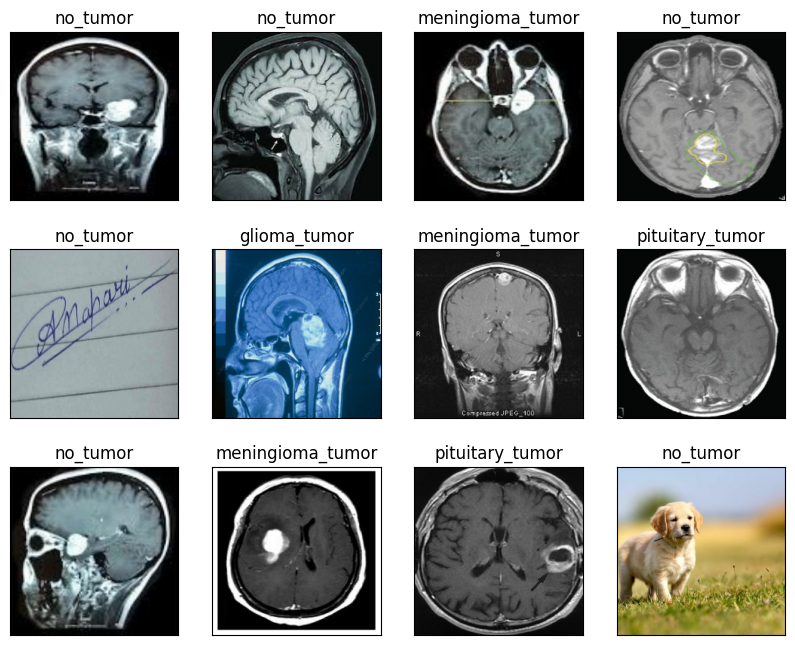

In [ ]:
# Check custom image predictions
plt.figure(figsize = (10,8))
for i, image in enumerate(custom_images):
  plt.subplot(3, 4, i+1) # Rows, column, index
  plt.xticks([])
  plt.yticks([]) # No need of ticks, set empty array
  plt.title(custom_pred_labels[i])
  plt.imshow(image)